### *** Description ***

Kiva.org is an online crowdfunding platform to extend financial services to poor and financially excluded people around the world. Kiva lenders have provided over $1 billion dollars in loans to over 2 million people. In order to set investment priorities, help inform lenders, and understand their target communities, knowing the level of poverty of each borrower is critical. However, this requires inference based on a limited set of information for each borrower.

In Kaggle Datasets' inaugural Data Science for Good challenge, Kiva is inviting the Kaggle community to help them build more localized models to estimate the poverty levels of residents in the regions where Kiva has active loans. Unlike traditional machine learning competitions with rigid evaluation criteria, participants will develop their own creative approaches to addressing the objective. Instead of making a prediction file as in a supervised machine learning problem, submissions in this challenge will take the form of Python and/or R data analyses using Kernels, Kaggle's hosted Jupyter Notebooks-based workbench.

Kiva has provided a dataset of loans issued over the last two years, and participants are invited to use this data as well as source external public datasets to help Kiva build models for assessing borrower welfare levels. Participants will write kernels on this dataset to submit as solutions to this objective and five winners will be selected by Kiva judges at the close of the event. In addition, awards will be made to encourage public code and data sharing. With a stronger understanding of their borrowers and their poverty levels, Kiva will be able to better assess and maximize the impact of their work.

The sections that follow describe in more detail how to participate, win, and use available resources to make a contribution towards helping Kiva better understand and help entrepreneurs around the world.

### *** Problem Statement ***

For the locations in which Kiva has active loans, your objective is to pair Kiva's data with additional data sources to estimate the welfare level of borrowers in specific regions, based on shared economic and demographic characteristics.

A good solution would connect the features of each loan or product to one of several poverty mapping datasets, which indicate the average level of welfare in a region on as granular a level as possible. Many datasets indicate the poverty rate in a given area, with varying levels of granularity. Kiva would like to be able to disaggregate these regional averages by gender, sector, or borrowing behavior in order to estimate a Kiva borrower’s level of welfare using all of the relevant information about them. Strong submissions will attempt to map vaguely described locations to more accurate geocodes.

Kernels submitted will be evaluated based on the following criteria:

1. Localization - How well does a submission account for highly localized borrower situations? Leveraging a variety of external datasets and successfully building them into a single submission will be crucial.

2. Execution - Submissions should be efficiently built and clearly explained so that Kiva’s team can readily employ them in their impact calculations.

3. Ingenuity - While there are many best practices to learn from in the field, there is no one way of using data to assess welfare levels. It’s a challenging, nuanced field and participants should experiment with new methods and diverse datasets.

In [1]:
# import the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# load the csv files onto the pandas dataframe
kloans = pd.read_csv('kiva_loans.csv')
kmpi = pd.read_csv('kiva_mpi_region_locations.csv')
kloanid = pd.read_csv('loan_theme_ids.csv')
kloantheme = pd.read_csv('loan_themes_by_region.csv')

In [2]:
# Get some basic information regarding the kiva loans and display the first 10 observations in the dataframe
pd.options.display.max_columns = None

kloans.info()
kloans.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671205 entries, 0 to 671204
Data columns (total 20 columns):
id                    671205 non-null int64
funded_amount         671205 non-null float64
loan_amount           671205 non-null float64
activity              671205 non-null object
sector                671205 non-null object
use                   666977 non-null object
country_code          671197 non-null object
country               671205 non-null object
region                614405 non-null object
currency              671205 non-null object
partner_id            657698 non-null float64
posted_time           671205 non-null object
disbursed_time        668809 non-null object
funded_time           622874 non-null object
term_in_months        671205 non-null float64
lender_count          671205 non-null int64
tags                  499789 non-null object
borrower_genders      666984 non-null object
repayment_interval    671205 non-null object
date                  671205 non

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
0,653051,300.0,300.0,Fruits & Vegetables,Food,"To buy seasonal, fresh fruits to sell.",PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:12:39+00:00,2013-12-17 08:00:00+00:00,2014-01-02 10:06:32+00:00,12.0,12,NaN,female,irregular,2014-01-01
1,653053,575.0,575.0,Rickshaw,Transportation,to repair and maintain the auto rickshaw used ...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 06:51:08+00:00,2013-12-17 08:00:00+00:00,2014-01-02 09:17:23+00:00,11.0,14,NaN,"female, female",irregular,2014-01-01
2,653068,150.0,150.0,Transportation,Transportation,To repair their old cycle-van and buy another ...,IN,India,Maynaguri,INR,334.0,2014-01-01 09:58:07+00:00,2013-12-17 08:00:00+00:00,2014-01-01 16:01:36+00:00,43.0,6,"user_favorite, user_favorite",female,bullet,2014-01-01
3,653063,200.0,200.0,Embroidery,Arts,to purchase an embroidery machine and a variet...,PK,Pakistan,Lahore,PKR,247.0,2014-01-01 08:03:11+00:00,2013-12-24 08:00:00+00:00,2014-01-01 13:00:00+00:00,11.0,8,NaN,female,irregular,2014-01-01
4,653084,400.0,400.0,Milk Sales,Food,to purchase one buffalo.,PK,Pakistan,Abdul Hakeem,PKR,245.0,2014-01-01 11:53:19+00:00,2013-12-17 08:00:00+00:00,2014-01-01 19:18:51+00:00,14.0,16,NaN,female,monthly,2014-01-01
5,1080148,250.0,250.0,Services,Services,purchase leather for my business using ksh 20000.,KE,Kenya,NaN,KES,NaN,2014-01-01 10:06:19+00:00,2014-01-30 01:42:48+00:00,2014-01-29 14:14:57+00:00,4.0,6,NaN,female,irregular,2014-01-01
6,653067,200.0,200.0,Dairy,Agriculture,To purchase a dairy cow and start a milk produ...,IN,India,Maynaguri,INR,334.0,2014-01-01 09:51:02+00:00,2013-12-16 08:00:00+00:00,2014-01-01 17:18:09+00:00,43.0,8,"user_favorite, user_favorite",female,bullet,2014-01-01
7,653078,400.0,400.0,Beauty Salon,Services,to buy more hair and skin care products.,PK,Pakistan,Ellahabad,PKR,245.0,2014-01-01 11:46:01+00:00,2013-12-20 08:00:00+00:00,2014-01-10 18:18:44+00:00,14.0,8,"#Elderly, #Woman Owned Biz",female,monthly,2014-01-01
8,653082,475.0,475.0,Manufacturing,Manufacturing,"to purchase leather, plastic soles and heels i...",PK,Pakistan,Lahore,PKR,245.0,2014-01-01 11:49:43+00:00,2013-12-20 08:00:00+00:00,2014-01-01 18:47:21+00:00,14.0,19,user_favorite,female,monthly,2014-01-01
9,653048,625.0,625.0,Food Production/Sales,Food,"to buy a stall, gram flour, ketchup, and coal ...",PK,Pakistan,Lahore,PKR,247.0,2014-01-01 05:41:03+00:00,2013-12-17 08:00:00+00:00,2014-01-03 15:45:04+00:00,11.0,24,NaN,female,irregular,2014-01-01


In [58]:
kloans[kloans['borrower_genders'].isnull()]

,id,funded_amount,loan_amount,activity,sector,use,country_code,country,region,currency,partner_id,posted_time,disbursed_time,funded_time,term_in_months,lender_count,tags,borrower_genders,repayment_interval,date
140,653375,2975.0,2975.0,Food Production/Sales,Food,NaN,TZ,Tanzania,NaN,TZS,87.0,2014-01-02 15:31:52+00:00,2013-12-24 08:00:00+00:00,2014-01-22 13:42:40+00:00,10.0,110,user_favorite,NaN,monthly,2014-01-02
145,653427,1200.0,1200.0,Personal Expenses,Personal Use,NaN,PE,Peru,NaN,PEN,139.0,2014-01-02 22:43:24+00:00,2013-12-17 08:00:00+00:00,2014-02-01 23:49:27+00:00,20.0,44,"#Single, user_favorite, user_favorite",NaN,monthly,2014-01-02
170,653177,4250.0,4250.0,Catering,Food,NaN,TZ,Tanzania,NaN,TZS,87.0,2014-01-02 06:46:10+00:00,2013-12-26 08:00:00+00:00,2014-01-23 16:52:15+00:00,10.0,116,"#Schooling, #Repeat Borrower, #Woman Owned Biz...",NaN,monthly,2014-01-02
412,653513,2350.0,2350.0,Beauty Salon,Services,NaN,TZ,Tanzania,NaN,TZS,87.0,2014-01-03 05:08:11+00:00,2013-12-31 08:00:00+00:00,2014-01-21 15:33:01+00:00,10.0,75,"user_favorite, #Parent, #Woman Owned Biz, user...",NaN,monthly,2014-01-03
414,653775,725.0,725.0,Agriculture,Agriculture,NaN,SV,El Salvador,NaN,USD,199.0,2014-01-03 21:41:23+00:00,2013-12-16 08:00:00+00:00,2014-01-28 17:28:43+00:00,20.0,19,"#Animals, #Repeat Borrower, #Schooling, user_f...",NaN,monthly,2014-01-03
464,653479,1000.0,1000.0,Sewing,Services,NaN,SV,El Salvador,NaN,USD,81.0,2014-01-03 02:02:03+00:00,2013-12-18 08:00:00+00:00,2014-01-04 11:45:23+00:00,22.0,39,NaN,NaN,monthly,2014-01-03
466,653757,1075.0,1075.0,Personal Housing Expenses,Housing,NaN,PE,Peru,NaN,PEN,139.0,2014-01-03 20:27:26+00:00,2013-12-16 08:00:00+00:00,2014-01-22 14:00:05+00:00,17.0,36,"user_favorite, #Single Parent, user_favorite",NaN,monthly,2014-01-03
546,653806,5450.0,5450.0,Retail,Retail,NaN,US,United States,NaN,USD,173.0,2014-01-03 23:50:05+00:00,2013-12-06 08:00:00+00:00,2014-01-31 17:52:40+00:00,32.0,166,"user_favorite, user_favorite",NaN,monthly,2014-01-03
595,653486,325.0,325.0,Clothing Sales,Clothing,NaN,PE,Peru,NaN,PEN,139.0,2014-01-03 02:26:18+00:00,2013-12-13 08:00:00+00:00,2014-01-14 19:12:14+00:00,12.0,11,"#First Loan, #Single",NaN,monthly,2014-01-03
616,653473,700.0,700.0,Food Production/Sales,Food,NaN,SV,El Salvador,NaN,USD,81.0,2014-01-03 01:43:52+00:00,2013-12-17 08:00:00+00:00,2014-01-21 19:01:03+00:00,16.0,26,"#Repeat Borrower, #Single Parent, #Woman Owned...",NaN,monthly,2014-01-03


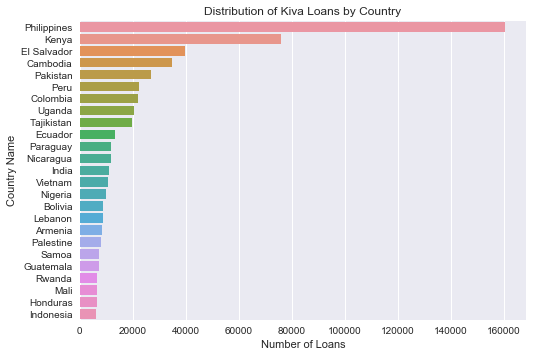

In [42]:
sns.countplot(y="country", data=kloans, 
              order=kloans.country.value_counts().iloc[:25].index).set_title("Distribution of Kiva Loans by Country")
plt.ylabel('Country Name')
plt.xlabel('Number of Loans')
plt.show()

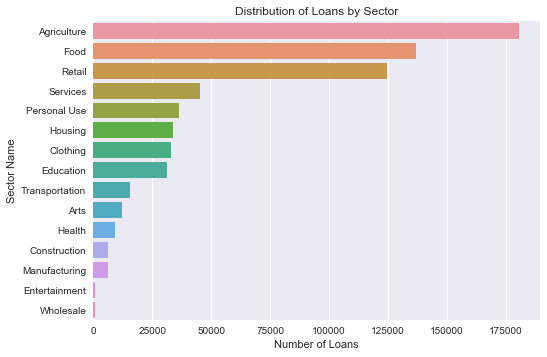

In [61]:
sns.countplot(y='sector', data=kloans, order=kloans.sector.value_counts().iloc[:25].index).set_title("Distribution of Loans by Sector")
plt.ylabel("Sector Name")
plt.xlabel("Number of Loans")
plt.show()

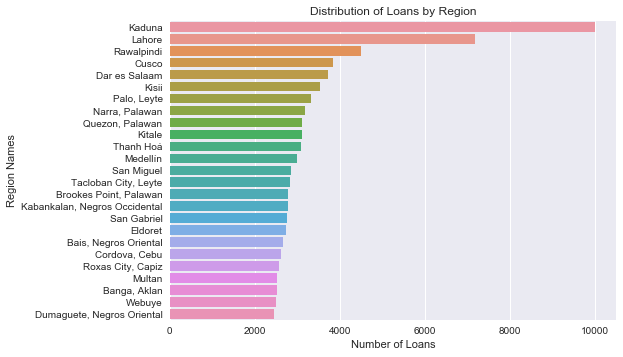

In [62]:
sns.countplot(y='region', data=kloans, order=kloans.region.value_counts().iloc[:25].index).set_title("Distribution of Loans by Region")
plt.ylabel("Region Names")
plt.xlabel("Number of Loans")
plt.show()

In [3]:
kmpi.info()
kmpi.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2772 entries, 0 to 2771
Data columns (total 9 columns):
LocationName    984 non-null object
ISO             1008 non-null object
country         1008 non-null object
region          984 non-null object
world_region    1008 non-null object
MPI             984 non-null float64
geo             2772 non-null object
lat             892 non-null float64
lon             892 non-null float64
dtypes: float64(3), object(6)
memory usage: 195.0+ KB


,LocationName,ISO,country,region,world_region,MPI,geo,lat,lon
0,"Badakhshan, Afghanistan",AFG,Afghanistan,Badakhshan,South Asia,0.387,"(36.7347725, 70.81199529999999)",36.734772,70.811995
1,"Badghis, Afghanistan",AFG,Afghanistan,Badghis,South Asia,0.466,"(35.1671339, 63.7695384)",35.167134,63.769538
2,"Baghlan, Afghanistan",AFG,Afghanistan,Baghlan,South Asia,0.300,"(35.8042947, 69.2877535)",35.804295,69.287754
3,"Balkh, Afghanistan",AFG,Afghanistan,Balkh,South Asia,0.301,"(36.7550603, 66.8975372)",36.755060,66.897537
4,"Bamyan, Afghanistan",AFG,Afghanistan,Bamyan,South Asia,0.325,"(34.8100067, 67.8212104)",34.810007,67.821210
5,"Daykundi, Afghanistan",AFG,Afghanistan,Daykundi,South Asia,0.313,"(33.669495, 66.0463534)",33.669495,66.046353
6,"Farah, Afghanistan",AFG,Afghanistan,Farah,South Asia,0.319,"(32.4464635, 62.1454133)",32.446464,62.145413
7,"Faryab, Afghanistan",AFG,Afghanistan,Faryab,South Asia,0.250,"(36.0795613, 64.90595499999999)",36.079561,64.905955
8,"Ghazni, Afghanistan",AFG,Afghanistan,Ghazni,South Asia,0.245,"(33.5450587, 68.4173972)",33.545059,68.417397
9,"Ghor, Afghanistan",AFG,Afghanistan,Ghor,South Asia,0.384,"(34.0995776, 64.90595499999999)",34.099578,64.905955


In [4]:
kloanid.info()
kloanid.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 779092 entries, 0 to 779091
Data columns (total 4 columns):
id                 779092 non-null int64
Loan Theme ID      764279 non-null object
Loan Theme Type    764279 non-null object
Partner ID         764279 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 23.8+ MB


,id,Loan Theme ID,Loan Theme Type,Partner ID
0,638631,a1050000000skGl,General,151.0
1,640322,a1050000000skGl,General,151.0
2,641006,a1050000002X1ij,Higher Education,160.0
3,641019,a1050000002X1ij,Higher Education,160.0
4,641594,a1050000002VbsW,Subsistence Agriculture,336.0
5,642256,a1050000000T3oX,Extreme Poverty,217.0
6,642311,a1050000000snTK,General,57.0
7,642353,a1050000000T3oX,Extreme Poverty,217.0
8,642386,a1050000000wf0f,General,133.0
9,642429,a1050000000wezJ,General,48.0


In [5]:
kloantheme.info()
kloantheme.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15736 entries, 0 to 15735
Data columns (total 21 columns):
Partner ID            15736 non-null int64
Field Partner Name    15736 non-null object
sector                15736 non-null object
Loan Theme ID         15736 non-null object
Loan Theme Type       15736 non-null object
country               15736 non-null object
forkiva               15736 non-null object
region                15736 non-null object
geocode_old           1200 non-null object
ISO                   15722 non-null object
number                15736 non-null int64
amount                15736 non-null int64
LocationName          15736 non-null object
geocode               13662 non-null object
names                 13661 non-null object
geo                   15736 non-null object
lat                   13662 non-null float64
lon                   13662 non-null float64
mpi_region            15722 non-null object
mpi_geo               9671 non-null object
rural_pct     

,Partner ID,Field Partner Name,sector,Loan Theme ID,Loan Theme Type,country,forkiva,region,geocode_old,ISO,number,amount,LocationName,geocode,names,geo,lat,lon,mpi_region,mpi_geo,rural_pct
0,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000000slfi,Higher Education,Cambodia,No,Banteay Meanchey,"(13.75, 103.0)",KHM,1,450,"Banteay Meanchey, Cambodia","[(13.6672596, 102.8975098)]",Banteay Meanchey Province; Cambodia,"(13.6672596, 102.8975098)",13.667260,102.897510,"Banteay Mean Chey, Cambodia","(13.6672596, 102.8975098)",90.0
1,9,KREDIT Microfinance Institution,General Financial Inclusion,a10500000068jPe,Vulnerable Populations,Cambodia,No,Battambang Province,NaN,KHM,58,20275,"Battambang Province, Cambodia","[(13.0286971, 102.989615)]",Battambang Province; Cambodia,"(13.0286971, 102.989615)",13.028697,102.989615,"Banteay Mean Chey, Cambodia","(13.6672596, 102.8975098)",90.0
2,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000000slfi,Higher Education,Cambodia,No,Battambang Province,NaN,KHM,7,9150,"Battambang Province, Cambodia","[(13.0286971, 102.989615)]",Battambang Province; Cambodia,"(13.0286971, 102.989615)",13.028697,102.989615,"Banteay Mean Chey, Cambodia","(13.6672596, 102.8975098)",90.0
3,9,KREDIT Microfinance Institution,General Financial Inclusion,a10500000068jPe,Vulnerable Populations,Cambodia,No,Kampong Cham Province,"(12.0, 105.5)",KHM,1383,604950,"Kampong Cham Province, Cambodia","[(12.0982918, 105.3131185)]",Kampong Cham Province; Cambodia,"(12.0982918, 105.3131185)",12.098292,105.313119,"Kampong Cham, Cambodia","(11.9924294, 105.4645408)",90.0
4,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000002X1Uu,Sanitation,Cambodia,No,Kampong Cham Province,"(12.0, 105.5)",KHM,3,275,"Kampong Cham Province, Cambodia","[(12.0982918, 105.3131185)]",Kampong Cham Province; Cambodia,"(12.0982918, 105.3131185)",12.098292,105.313119,"Kampong Cham, Cambodia","(11.9924294, 105.4645408)",90.0
5,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000000slfi,Higher Education,Cambodia,No,Kampong Cham Province,"(12.0, 105.5)",KHM,36,62225,"Kampong Cham Province, Cambodia","[(12.0982918, 105.3131185)]",Kampong Cham Province; Cambodia,"(12.0982918, 105.3131185)",12.098292,105.313119,"Kampong Cham, Cambodia","(11.9924294, 105.4645408)",90.0
6,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000007VvXr,Solar Home Systems,Cambodia,No,Kampong Cham Province,"(12.0, 105.5)",KHM,2,1300,"Kampong Cham Province, Cambodia","[(12.0982918, 105.3131185)]",Kampong Cham Province; Cambodia,"(12.0982918, 105.3131185)",12.098292,105.313119,"Kampong Cham, Cambodia","(11.9924294, 105.4645408)",90.0
7,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000000weyk,General,Cambodia,No,Kampong Chhnang Province,"(12.0, 104.5)",KHM,249,237175,"Kampong Chhnang Province, Cambodia","[(12.1392352, 104.5655273)]",Kampong Chhnang Province; Cambodia,"(12.1392352, 104.5655273)",12.139235,104.565527,"Kampong Chhnang, Cambodia","(12.1392352, 104.5655273)",90.0
8,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000007VvXr,Solar Home Systems,Cambodia,No,Kampong Chhnang Province,"(12.0, 104.5)",KHM,7,3050,"Kampong Chhnang Province, Cambodia","[(12.1392352, 104.5655273)]",Kampong Chhnang Province; Cambodia,"(12.1392352, 104.5655273)",12.139235,104.565527,"Kampong Chhnang, Cambodia","(12.1392352, 104.5655273)",90.0
9,9,KREDIT Microfinance Institution,General Financial Inclusion,a1050000000slfi,Higher Education,Cambodia,No,Kampong Chhnang Province,"(12.0, 104.5)",KHM,18,31425,"Kampong Chhnang Province, Cambodia","[(12.1392352, 104.5655273)]",Kampong Chhnang Province; Cambodia,"(12.1392352, 104.5655273)",12.139235,104.565527,"Kampong Chhnang, Cambodia","(12.1392352, 104.5655273)",90.0


In [9]:
import plotly
print(plotly.__version__)
plotly.offline.init_notebook_mode()
plotly.offline.iplot({
   "data": [{
        "x":[1,2,3],
        "y":[4,5,6]}],
    "layout": {"title": "Hello World"}
})

3.2.0


In [71]:
help(plotly)

Help on package plotly:

NAME
    plotly - https://plot.ly/python/

DESCRIPTION
    Plotly's Python API allows users to programmatically access Plotly's
    server resources.
    
    This package is organized as follows:
    
    Subpackages:
    
    - plotly: all functionality that requires access to Plotly's servers
    
    - graph_objs: objects for designing figures and visualizing data
    
    - matplotlylib: tools to convert matplotlib figures
    
    Modules:
    
    - tools: some helpful tools that do not require access to Plotly's servers
    
    - utils: functions that you probably won't need, but that subpackages use
    
    - version: holds the current API version
    
    - exceptions: defines our custom exception classes

PACKAGE CONTENTS
    animation
    api (package)
    basedatatypes
    basewidget
    callbacks
    colors
    config
    dashboard_objs (package)
    exceptions
    figure_factory (package)
    files
    graph_objs (package)
    graph_reference
 

In [10]:
check=kloantheme.dropna(subset=['lon','lat']).drop_duplicates(subset=['lon','lat'])
len(check)

6557

In [24]:
import folium
from folium.plugins import MarkerCluster
check1 = kloantheme.dropna(subset=['lat', 'lon']).drop_duplicates(subset=['lat', 'lon'])

m3 = folium.Map(location=[20,0], tiles="Mapbox Bright", zoom_start=1)
marker = MarkerCluster().add_to(m3)
for i in range(0,len(check1)):
    folium.Marker([check1.iloc[i]['lat'], check1.iloc[i]['lon']], popup=check1.iloc[i]['region']).add_to(marker)
m3

In [13]:
import folium
# trial=kloantheme['region'].value_counts()
# region = check.drop_duplicates(subset=['lat','lon'])
india = check.loc[check['country']=='India']
india.head()
m = folium.Map(location=[20,80], tiles="Mapbox Bright", zoom_start=3)
for i in range(0,len(india)):
    folium.Marker(
        [india.iloc[i]['lat'], india.iloc[i]['lon']], popup=india.iloc[i]['region']
    ).add_to(m)
m

In [20]:
from folium.plugins import MarkerCluster
m2 = folium.Map(location=[20,80], tiles="Mapbox Bright", zoom_start=4)
marker_cluster = MarkerCluster().add_to(m2)
for i in range(0,len(india)):
    folium.Marker([india.iloc[i]['lat'], india.iloc[i]['lon']], popup=india.iloc[i]['region']).add_to(marker_cluster)
m2

# for point in range(0, len(locationlist)):
#     folium.Marker(locationlist[point], popup=df_counters['Name'][point]).add_to(marker_cluster)
# map2

In [144]:
india.head(50)

,Partner ID,Field Partner Name,sector,Loan Theme ID,Loan Theme Type,country,forkiva,region,geocode_old,ISO,...,amount,LocationName,geocode,names,geo,lat,lon,mpi_region,mpi_geo,rural_pct
11972,225,Novica,Artisan,a1050000000T14Q,Artisan,India,No,Agra,NaN,IND,...,2100,"Agra, India","[(27.1766701, 78.00807449999999)]",Agra; Agra; Uttar Pradesh; India,"(27.1766701, 78.00807449999999)",27.176670,78.008075,IND,NaN,0.0
11986,225,Novica,Artisan,a1050000000T14Q,Artisan,India,No,Haryana,NaN,IND,...,1200,"Haryana, India","[(29.0587757, 76.085601)]",Haryana; India,"(29.0587757, 76.085601)",29.058776,76.085601,IND,NaN,0.0
11987,225,Novica,Artisan,a1050000000T14Q,Artisan,India,No,Jaipur,NaN,IND,...,4000,"Jaipur, India","[(26.9124336, 75.7872709)]",Jaipur; Jaipur; Rajasthan; India,"(26.9124336, 75.7872709)",26.912434,75.787271,IND,NaN,0.0
11994,225,Novica,Artisan,a1050000000T14Q,Artisan,India,No,New Delhi,NaN,IND,...,6050,"New Delhi, India","[(28.6139391, 77.2090212)]",New Delhi; Delhi; India,"(28.6139391, 77.2090212)",28.613939,77.209021,IND,NaN,0.0
12085,238,WSDS-Initiate,General Financial Inclusion,a1050000000sjE7,Underserved,India,No,Bishnupur,NaN,IND,...,2675,"Bishnupur, India","[(23.0678795, 87.3165222)]",Bishnupur; Bankura; West Bengal; India; 722122,"(23.0678795, 87.3165222)",23.067880,87.316522,IND,NaN,0.0
12086,238,WSDS-Initiate,General Financial Inclusion,a1050000000sjE7,Underserved,India,No,Churachandpur,NaN,IND,...,20850,"Churachandpur, India","[(24.2993576, 93.2583626)]",Churachandpur; Manipur; India,"(24.2993576, 93.2583626)",24.299358,93.258363,IND,NaN,0.0
12087,238,WSDS-Initiate,General Financial Inclusion,a1050000000sjE7,Underserved,India,No,Imphal East,NaN,IND,...,26050,"Imphal East, India","[(24.7806536, 93.9674371)]",Imphal East; Manipur; India,"(24.7806536, 93.9674371)",24.780654,93.967437,IND,NaN,0.0
12088,238,WSDS-Initiate,General Financial Inclusion,a1050000000sjE7,Underserved,India,No,Saikul,NaN,IND,...,15975,"Saikul, India","[(25.0577509, 94.02963539999999)]",Saikul; Senapati; Manipur; India; 795118,"(25.0577509, 94.02963539999999)",25.057751,94.029635,IND,NaN,0.0
12114,241,People's Forum,General Financial Inclusion,a1050000002VU1O,Water and Sanitation,India,Yes,"Aanandpur,Odisha",NaN,IND,...,3525,"Aanandpur,Odisha, India","[(21.2148488, 86.1248967)]",Anandapur; Kendujhar; Odisha; India,"(21.2148488, 86.1248967)",21.214849,86.124897,IND,NaN,92.0
12118,241,People's Forum,General Financial Inclusion,a1050000002VU4f,Higher Education,India,No,"Angul, Odisha",NaN,IND,...,575,"Angul, Odisha, India","[(20.8444033, 85.1510818)]",Angul; Angul; Odisha; India,"(20.8444033, 85.1510818)",20.844403,85.151082,IND,NaN,92.0


In [125]:
region = check.drop_duplicates(subset=['lat','lon'])
region = region.drop_duplicates(subset=['lat','lon'])
len(region)
# for i in range(0,len(region)):
#     print(check.iloc[i]['lon'], check.iloc[i]['lat'], check.iloc[i]['region'])
    
# region.iloc[1:4]

6557

In [5]:
help(folium)

Help on package folium:

NAME
    folium - # -*- coding: utf-8 -*-

PACKAGE CONTENTS
    _version
    features
    folium
    map
    plugins (package)
    raster_layers
    utilities
    vector_layers

CLASSES
    builtins.object
        branca.element.Element
            branca.element.Figure
                branca.element.Div
            branca.element.Html
            branca.element.IFrame
            branca.element.Link
                branca.element.CssLink
                branca.element.JavascriptLink
            branca.element.MacroElement
                branca.colormap.ColorMap
                    branca.colormap.LinearColormap
                    branca.colormap.StepColormap
                folium.features.ClickForMarker
                folium.features.DivIcon
                folium.features.LatLngPopup
                folium.folium.Map
                folium.map.FitBounds
                folium.map.Icon
                    folium.features.CustomIcon
                folium.m